In [1]:
import Pkg
Pkg.activate(@__DIR__)

  Activating project at `~/github/code/invariance-code`


In [2]:
using LinearAlgebra, Distributions, SpecialFunctions
using Plots, Plots.Measures, PlotUtils, LaTeXStrings
pyplot(reuse=true, format=:png)

Plots.PyPlotBackend()

---
# Example A.2 (Surface of $\mathbb{S}^2$)

In [3]:
function sphere(θ, t)
    (sin(θ) * cos(t), sin(θ) * sin(t), cos(θ))
end

function plt_sp(f; α=1, θ=(0, π), t=(0, 2π), n=(100, 100), kwargs...)
    pyplot(reuse=true, format=:png)
    
    θs = range(θ..., length=n[1])
    ts = range(t..., length=n[2])
    
    pts = [sphere(θ, t;) for θ in θs, t = ts]
    f_vals = [f(θ, t; α=α) for θ in θs, t = ts]
    
    X, Y, Z = map(i -> map(x -> x[i], pts), 1:3)

    p = plot(
        X, Y, Z; fill_z=f_vals,
        st=:surface, lw=0, la=0, 
        clim=(0.0, maximum(f_vals)),
        kwargs...
    )
    close()
    return p
end

plt_params = (;
    legend=false, ticks=false, grid=false, axis=false,
    cb=true, c=:viridis, size=(400, 400), camera=(60, 30)
)

(legend = false, ticks = false, grid = false, axis = false, cb = true, c = :viridis, size = (400, 400), camera = (60, 30))

In [4]:
φ(θ, t, α=0) = mod(θ + α * t / 2, π)

f_arc(θ; ξ=(10, 10)) = pdf(Beta(ξ...), θ / π)

f_circle(t) = 1 / 2π

f_sphere(θ, t; α=0) = f_arc(φ(θ, t, α)) * f_circle(t)

f_sphere (generic function with 1 method)

In [5]:
plt1(α; kwargs...) = plt_sp(f_sphere; α=α, title=L"α=%$(round.(Int, α))", plt_params..., aspect_ratio=:equal, kwargs...)

plt1 (generic function with 1 method)

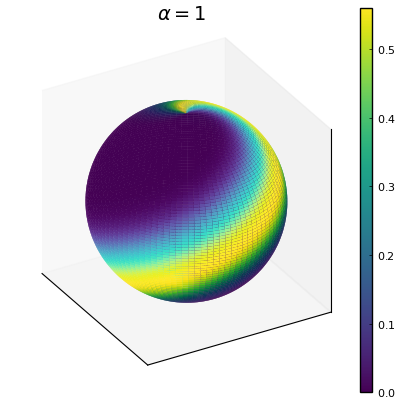

In [6]:
plt1(1)

[ Info: Saved animation to /Users/svishwanath/github/code/invariance-code/tmp.gif


Plots.AnimatedGif("/Users/svishwanath/github/code/invariance-code/tmp.gif")
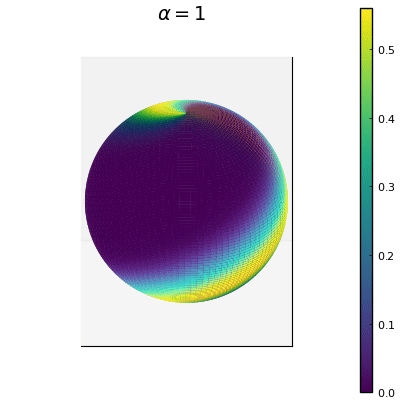

In [7]:
a = @animate for u in range(0, 360, length=40)
    plt1(1, camera=(u, 30))
end
gif(a, fps=5)

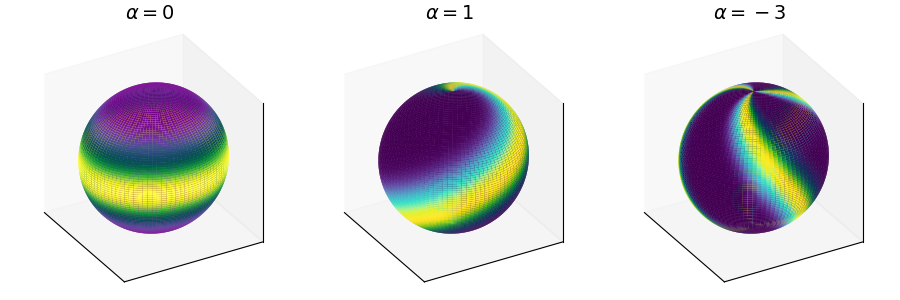

In [8]:
plot(
    plt1(0, cb=false), plt1(1, cb=false), plt1(-3, cb=false), 
    layout=(1, 3), size=(900, 300)
)

[ Info: Saved animation to /Users/svishwanath/github/code/invariance-code/tmp.gif


Plots.AnimatedGif("/Users/svishwanath/github/code/invariance-code/tmp.gif")
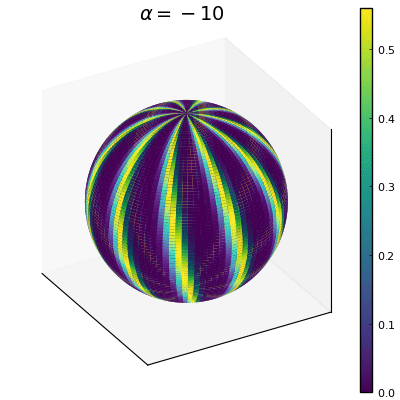

In [9]:
a = @animate for α in [-10:1:0; 0; 0:1:10...]
    plt1(α)
end
gif(a, fps=5)